In [2]:
import csv
import gzip
import json
import math
import os
import sys
import random
import bisect
from typing import Dict, Any, List, Tuple

import numpy as np
import pandas as pd
import optuna

# -----------------------
# Configuration / Hardcoded Paths
# -----------------------
SAMPLES_CSV = "training_complete_processed_metadata.csv"
OUT_DIR = "training_results"
BLACKLIST_BED = "../../resources/master_blacklist.bed" 
ARTEFACT_GENES_BED = "../../resources/master_blacklist.bed"
EXOME_BED_PATH = "../../resources/hg38_exome_v2.0.2_targets_sorted_validated.re_annotated.bed" 
N_TRIALS = 6000
SEED = 42

# -----------------------
# Constants
# -----------------------
GENOME_SIZE = 6.4e9
R_CORD = 2e-8
EPS = 1e-15
CORD_WEIGHT = 3.0

# Set seeds
random.seed(SEED)
np.random.seed(SEED)

# -----------------------
# Math Helpers
# -----------------------
def poisson_deviance(y_arr: np.ndarray, lam_arr: np.ndarray, weights: np.ndarray = None) -> float:
    y = np.asarray(y_arr, dtype=float)
    lam = np.asarray(lam_arr, dtype=float) + EPS
    
    with np.errstate(divide='ignore', invalid='ignore'):
        log_term = np.log(y / lam)
        term1 = np.where(y > 0, y * log_term, 0.0)
    
    dev = 2.0 * (term1 - (y - lam))
    
    if weights is not None:
        dev = dev * weights
        
    return float(np.sum(dev))

def expected_lambda(sample_type: str, age: float, bases: float) -> float:
    st = sample_type.lower()
    current_age = float(age) if age is not None else 0.0
    
    if "cord" in st:
        rate = R_CORD
    elif "pbmc" in st:
        rate = (16 * current_age + 105) / GENOME_SIZE
    else:
        rate = (22 * current_age + 164) / GENOME_SIZE
        
    return rate * bases

# -----------------------
# BED File Lookup Logic
# -----------------------
class BedLookup:
    def __init__(self, bed_path: str, name: str):
        self.intervals = {} 
        self.name = name
        self._load_bed(bed_path)

    def _load_bed(self, bed_path: str):
        if not os.path.exists(bed_path):
            print(f"[WARN] BED file not found: {bed_path}. {self.name} filter will do nothing.", file=sys.stderr)
            return

        print(f"[INFO] Loading {self.name} from {bed_path}...")
        count = 0
        with open(bed_path, 'r') as f:
            for line in f:
                if line.startswith('#') or not line.strip():
                    continue
                parts = line.strip().split()
                if len(parts) < 3:
                    continue
                chrom = parts[0]
                start, end = int(parts[1]), int(parts[2])
                
                if chrom not in self.intervals:
                    self.intervals[chrom] = []
                self.intervals[chrom].append((start, end))
                count += 1
        
        for chrom in self.intervals:
            self.intervals[chrom].sort(key=lambda x: x[0])
        print(f"[INFO] Loaded {count} regions for {self.name}.")

    def is_overlapped(self, chrom: str, pos: int) -> bool:
        if chrom not in self.intervals:
            return False
        
        regions = self.intervals[chrom]
        query_idx = pos - 1 
        
        idx = bisect.bisect_right(regions, (query_idx, float('inf')))
        
        for i in range(max(0, idx - 1), -1, -1):
            start, end = regions[i]
            if end <= query_idx:
                break 
            if start <= query_idx < end:
                return True
        return False

# -----------------------
# VCF Parsing to DataFrame
# -----------------------
def parse_vcf_to_df(vcf_path: str, sample_id: str) -> pd.DataFrame:
    data = []
    
    if not os.path.exists(vcf_path):
        print(f"[WARN] File not found: {vcf_path}", file=sys.stderr)
        return pd.DataFrame()

    openf = gzip.open if vcf_path.endswith(".gz") else open
    
    try:
        with openf(vcf_path, "rt") as fh:
            for line in fh:
                if line.startswith("#"):
                    continue
                fields = line.strip().split("\t")
                
                chrom = fields[0]
                pos = int(fields[1])
                ref = fields[3]  # <--- FIXED: Extract REF from VCF column 4
                alt = fields[4]  # <--- FIXED: Extract ALT from VCF column 5
                
                info_str = fields[7]
                info_dict = {}
                for item in info_str.split(";"):
                    if "=" in item:
                        k, v = item.split("=", 1)
                        info_dict[k] = v
                    else:
                        info_dict[item] = "Yes" 
                
                info_dict["sample_id"] = sample_id
                info_dict["CHROM"] = chrom
                info_dict["POS"] = pos
                info_dict["REF"] = ref  # <--- Added
                info_dict["ALT"] = alt  # <--- Added
                data.append(info_dict)
    except Exception as e:
        print(f"[ERROR] Error reading {vcf_path}: {e}", file=sys.stderr)
        return pd.DataFrame()

    if not data:
        return pd.DataFrame()

    df = pd.DataFrame(data)
    
    # --- Type Conversion ---
    def to_num(col, dtype, default):
        if col in df.columns:
            return pd.to_numeric(df[col], errors='coerce').fillna(default).astype(dtype)
        return pd.Series([default]*len(df), index=df.index, dtype=dtype)

    def to_str(col, default):
        if col in df.columns:
            return df[col].fillna(default)
        return pd.Series([default]*len(df), index=df.index)

    df['CHROM'] = to_str('CHROM', 'chr1')
    df['POS'] = to_num('POS', int, 0)
    df['REF'] = to_str('REF', '') # <--- Added
    df['ALT'] = to_str('ALT', '') # <--- Added

    # 1. Base Counts
    df['N_ALT_SSCS'] = to_num('N_ALT_SSCS', int, 0)
    df['N_TOTAL'] = to_num('N_TOTAL', int, 0)
    df['N_ALT'] = to_num('N_ALT', int, 0) 
    df['N_TOTAL_SSCS'] = to_num('N_TOTAL_SSCS', int, 0)
    df['N_TOTAL_SSCS'] = np.where(df['N_TOTAL_SSCS'] <= 0, df['N_TOTAL'], df['N_TOTAL_SSCS'])

    df['DIST_TO_INDEL'] = to_num('DIST_TO_INDEL', int, -1)
    df['HOMOPOLYMER_LEN'] = to_num('HOMOPOLYMER_LEN', int, 0)
    df['DEPTH_PERCENTILE'] = to_num('DP_PERCENT', int, 50)

    # 2. Integer Metrics
    df['VARIANTS_20BP'] = to_num('VARIANTS_20BP', int, 0)
    df['VARIANTS_250BP'] = to_num('VARIANTS_250BP', int, 0)
    df['MEDIAN_DIST_TO_SOFTCLIP'] = to_num('MEDIAN_DIST_TO_SOFTCLIP', int, 1000)

    # 3. Float Metrics
    df['AVG_ASXS'] = to_num('AVG_ALT_ASXS', float, 0.0) 
    df['MEAN_MAPQ'] = to_num('MEAN_ALT_MAPQ', float, 0.0)
    df['MEAN_REF_MAPQ'] = to_num('MEAN_REF_MAPQ', float, 0.0) 
    df['MEAN_BASEQ'] = to_num('MEAN_ALT_BASEQ', float, 0.0) 
    df['SD_BASEQ'] = to_num('SD_ALT_BASEQ', float, 0.0)
    df['GC_CONTENT'] = to_num('GC_CONTENT', float, 0.5)
    df['STRAND_BIAS_SSCS'] = to_num('STRAND_BIAS_SSCS', float, 0.5)
    df['RP_SD_SSCS'] = to_num('RP_SD_SSCS', float, 0.0)
    df['RP_MED_SSCS'] = to_num('RP_MED_SSCS', float, 0.5)
    df['AVG_ALTREAD_VARIANTS'] = to_num('AVG_ALTREAD_VARIANTS', float, 0.0)
    df['AVG_NONALTREAD_VARIANTS'] = to_num('AVG_NONALTREAD_VARIANTS', float, 0.0)
    df['REF_ENTROPY_40BP'] = to_num('REF_ENTROPY_40BP', float, 2.0)
    df['AVG_ALT_SOFTCLIP'] = to_num('AVG_ALT_SOFTCLIP', float, 0.0)
    df['AVG_ALT_N_COUNT'] = to_num('AVG_ALT_N_COUNT', float, 0.0)
    df['AVG_ALT_NM'] = to_num('AVG_ALT_NM', float, 0.0)
    df['MEAN_INSERT'] = to_num('MEAN_INSERT', float, 200.0)
    df['SD_INSERT'] = to_num('SD_INSERT', float, 0)
    df['AVG_ALT_READ_MEAN_BQ'] = to_num('AVG_ALT_READ_MEAN_BQ', float, 0.0)
    
    # --- ADDED: READ POSITION ---
    df['AVG_READ_POSITION'] = to_num('AVG_READ_POSITION', float, 75.0)
    

    # 4. Flags
    df['IN_CORD_PON'] = to_str('IN_CB_PON', "No")
    df['IN_GNOMAD_COMMON'] = to_str('IN_GNOMAD_COMMON', "No")
    df['IN_ENCODE_BLACKLIST'] = to_str('IN_ENCODE_BLACKLIST', "No")
    df['IN_REPEATMASKER'] = to_str('IN_REPEATMASKER', "No")

    # 5. VAFs
    with np.errstate(divide='ignore', invalid='ignore'):
        df['VAF_DCS'] = df['N_ALT'] / df['N_TOTAL']
        df['VAF_DCS'] = df['VAF_DCS'].fillna(0.0)


    return df

# -----------------------
# Vectorized Filtering
# -----------------------
def get_passing_mask(df: pd.DataFrame, thresholds: Dict[str, Any], pon_flags: Dict[str, bool], ignore_blacklists: bool = False) -> pd.Series:
    # 1. BASELINE HARD FILTERS
    mask = (df['N_ALT_SSCS'] > 0) & \
           (df['IN_ENCODE_BLACKLIST'] != "Yes") & \
           (df['IN_REPEATMASKER'] != "Yes")
            #
    
    # --- ADDED: OxoG / Read Position Hard Filter ---
    # Removes variants too close to the start (<4) or end (>138) of the read
    mask &= (df['AVG_READ_POSITION'] >= 4) & (df['AVG_READ_POSITION'] <= 138)

    if pon_flags.get("use_cord_pon", False):
        mask &= (df['IN_CORD_PON'] != "Yes")

    if not ignore_blacklists:
        mask &= (df['IN_CLUSTER_BLACKLIST'] == False)
        mask &= (df['IN_ARTEFACT_BLACKLIST'] == False)

    # 2. DEPTH
    mask &= (df['N_TOTAL'] >= thresholds['n_total_min'])
    mask &= (df['DEPTH_PERCENTILE'] <= thresholds['depth_percentile_max'])

    # 3. QUALITY METRICS
    mask &= (df['AVG_ASXS'] > thresholds['asxs_min'])
    mask &= (df['MEAN_MAPQ'] >= thresholds['mean_mapq_min'])
    mask &= (df['MEAN_REF_MAPQ'] >= thresholds['mean_ref_mapq_min'])
    mask &= (df['MEAN_BASEQ'] >= thresholds['mean_baseq_min'])
    mask &= (df['SD_BASEQ'] <= thresholds['sd_baseq_max'])

    mask &= ((df['DIST_TO_INDEL'] == -1) | (df['DIST_TO_INDEL'] >= thresholds['dist_to_indel_min']))

    # 4. TUNABLE FILTERS
    mask &= (df['VARIANTS_20BP'] <= thresholds['variants_20bp_max'])
    mask &= (df['VARIANTS_250BP'] <= thresholds['variants_250bp_max'])

    mask &= (df['AVG_ALT_SOFTCLIP'] <= thresholds['avg_alt_softclip_max'])
    mask &= (df['MEDIAN_DIST_TO_SOFTCLIP'] >= thresholds['dist_to_softclip_min'])
    mask &= (df['AVG_ALT_N_COUNT'] <= thresholds['avg_alt_n_count_max'])
    mask &= (df['AVG_ALT_NM'] <= thresholds['avg_alt_nm_max'])
    mask &= (df['MEAN_INSERT'] <= thresholds['mean_insert_max'])
    mask &= (df['MEAN_INSERT'] >= thresholds['mean_insert_min'])

    mask &= (df['SD_INSERT'] <= thresholds['sd_insert_max'])

    # 5. CONTEXT & STRAND

    mask &= (df['HOMOPOLYMER_LEN'] <= thresholds['homopolymer_len_max'])

    # Strand Bias 
    enough_reads_sb = df['N_ALT_SSCS'] >= thresholds['strand_bias_n_alt_min']
    bad_bias = (df['STRAND_BIAS_SSCS'] < thresholds['strand_bias_min']) | (df['STRAND_BIAS_SSCS'] > thresholds['strand_bias_max'])
    mask &= ~(enough_reads_sb & bad_bias)

    # RP SD 
    enough_reads_rp = df['N_ALT_SSCS'] >= thresholds['rp_sd_min_alt']
    bad_rp_sd = df['RP_SD_SSCS'] < thresholds['rp_sd_min']
    mask &= ~(enough_reads_rp & bad_rp_sd)

    # RP MED
    mask &= (df['RP_MED_SSCS'] > thresholds['rp_med_min']) & (df['RP_MED_SSCS'] < thresholds['rp_med_max'])


    
    # 7. GERMLINE & COMMON
    mask &= (df['VAF_DCS'] <= thresholds['germline_vaf_max'])
    high_vaf_gnomad = (df['VAF_DCS'] > thresholds['gnomad_vaf_cutoff'])
    is_common = (df['IN_GNOMAD_COMMON'] == "Yes") 
    mask &= ~(high_vaf_gnomad & is_common)

    return mask

# -----------------------
# Optimization Objective
# -----------------------
def suggest_thresholds_sing(trial: optuna.Trial) -> Dict[str, Any]:
    """Parameter space specifically constrained for singletons (N_ALT == 1)."""
    return {
        "avg_alt_n_count_max": trial.suggest_float("sing_avg_alt_n_count_max", 0.0, 3.0),
        "n_total_min": trial.suggest_int("sing_n_total_min", 20, 20),


        # --- TUNED DIFFERENTLY ---
        # STRICTER: High base quality required to trust a single read
        "mean_baseq_min": trial.suggest_int("sing_mean_baseq_min", 50, 120),
        "rp_med_min": trial.suggest_float("sing_rp_med_min", 0.01, 0.1),
        "rp_med_max": trial.suggest_float("sing_rp_med_max", 0.9, 0.99),
        "homopolymer_len_max": trial.suggest_int("sing_homopolymer_len_max", 0, 8),
        "dist_to_indel_min": trial.suggest_int("sing_dist_to_indel_min", 0, 50),
        "mean_insert_max": trial.suggest_float("sing_mean_insert_max", 400, 800.0),
        "mean_insert_min": trial.suggest_float("sing_mean_insert_min", 0, 100.0),
        "dist_to_softclip_min": trial.suggest_int("sing_dist_to_softclip_min", 0, 10),


        # LOOSER: Mapping quality can afford to be slightly broader
        "mean_mapq_min": trial.suggest_int("sing_mean_mapq_min", 20, 60),
        "mean_ref_mapq_min": trial.suggest_int("sing_mean_ref_mapq_min", 10, 60),
        "asxs_min": trial.suggest_int("sing_asxs_min", 10, 60),
        "avg_alt_nm_max": trial.suggest_float("sing_avg_alt_nm_max", 1.0, 3.0),
        "avg_alt_softclip_max": trial.suggest_float("sing_avg_alt_softclip_max", 0.0, 3.0),
        "variants_20bp_max": trial.suggest_int("sing_variants_20bp_max", 0, 3),
        "variants_250bp_max": trial.suggest_int("sing_variants_250bp_max", 0, 10),
        

        # --- HARDCODED BYPASSES FOR UNAVAILABLE METRICS ---
        # These bypass the mask checks without needing to change `get_passing_mask`
        "sd_baseq_max": 999,
        "gnomad_vaf_cutoff": 0.20,
        "sd_insert_max": 9999.0,
        "germline_vaf_max": 0.20,
        "strand_bias_n_alt_min": 999,  # Ensures 'enough_reads_sb' is always False
        "strand_bias_min": 0.0,
        "strand_bias_max": 1.0,
        "rp_sd_min": 0.0,
        "depth_percentile_max": 100,
        "rp_sd_min_alt": 999,          # Ensures 'enough_reads_rp' is always False
    }

def suggest_thresholds_mult(trial: optuna.Trial) -> Dict[str, Any]:
    """Parameter space specifically constrained for multi-variants (N_ALT >= 2)."""
    return {
        "gnomad_vaf_cutoff": trial.suggest_float("mult_gnomad_vaf_cutoff", 0.10, 0.20),
        

        
    
        "avg_alt_n_count_max": trial.suggest_float("mult_avg_alt_n_count_max", 0.0, 3.0),

        "mean_insert_max": trial.suggest_float("mult_mean_insert_max", 400, 800.0),
        "mean_insert_min": trial.suggest_float("mult_mean_insert_min", 0, 100.0),
        "sd_insert_max": trial.suggest_float("mult_sd_insert_max", 0, 800.0),
        


        "n_total_min": trial.suggest_int("mult_n_total_min", 20, 20),


        # --- TUNED DIFFERENTLY ---
        # LOOSER: Base quality bounds can stretch lower because multiple reads provide confidence
        "mean_baseq_min": trial.suggest_int("mult_mean_baseq_min", 20, 60), 
        "rp_med_min": trial.suggest_float("mult_rp_med_min", 0.01, 0.05),
        "rp_med_max": trial.suggest_float("mult_rp_med_max", 0.95, 0.99),
        "homopolymer_len_max": trial.suggest_int("mult_homopolymer_len_max", 0, 12),
        "dist_to_indel_min": trial.suggest_int("mult_dist_to_indel_min", 0, 500),
        "dist_to_softclip_min": trial.suggest_int("mult_dist_to_softclip_min", 0, 5),

        # STRICTER: Tight mapq bounds to ensure aligned clustering isn't an artifact
        "mean_mapq_min": trial.suggest_int("mult_mean_mapq_min", 50, 60),
        "mean_ref_mapq_min": trial.suggest_int("mult_mean_ref_mapq_min", 40, 60),
        "depth_percentile_max": trial.suggest_int("mult_depth_percentile_max", 95, 99),
        "asxs_min": trial.suggest_int("mult_asxs_min", 25, 60),
        "avg_alt_softclip_max": trial.suggest_float("mult_avg_alt_softclip_max", 0.0, 1.5),
        "variants_20bp_max": trial.suggest_int("mult_variants_20bp_max", 0, 2),
        "variants_250bp_max": trial.suggest_int("mult_variants_250bp_max", 0, 4),
        "avg_alt_nm_max": trial.suggest_float("mult_avg_alt_nm_max", 1.0, 2.0),

        # --- MULTI-READ SPECIFIC METRICS ---
        "sd_baseq_max": trial.suggest_int("mult_sd_baseq_max", 0, 120),
        "strand_bias_n_alt_min": trial.suggest_int("mult_strand_bias_n_alt_min", 3, 5),
        "strand_bias_min": trial.suggest_float("mult_strand_bias_min", 0.0, 0.2),
        "strand_bias_max": trial.suggest_float("mult_strand_bias_max", 0.8, 1.0),
        "rp_sd_min": trial.suggest_float("mult_rp_sd_min", 0.01, 0.2),
        "rp_sd_min_alt": trial.suggest_int("mult_rp_sd_min_alt", 3, 5),



        "germline_vaf_max": 0.20,
    }

def get_combined_passing_mask(df: pd.DataFrame, thresholds_sing: Dict[str, Any], thresholds_mult: Dict[str, Any], pon_flags: Dict[str, bool], ignore_blacklists: bool = False) -> pd.Series:
    """Applies separate filters based on N_ALT counts."""
    # Compute masks for both threshold sets
    mask_sing = get_passing_mask(df, thresholds_sing, pon_flags, ignore_blacklists)
    mask_mult = get_passing_mask(df, thresholds_mult, pon_flags, ignore_blacklists)

    # Apply conditionally
    is_sing = df['N_ALT'] == 1
    is_mult = df['N_ALT'] >= 2

    return (is_sing & mask_sing) | (is_mult & mask_mult)

def make_objective(all_variants_df: pd.DataFrame, samples_meta: List[Dict]):
    expected_lambdas = []
    weights = []
    
    for s in samples_meta:
        expected_lambdas.append(expected_lambda(s['sample_type'], s['age'], s['bases']))
        
        if "cord" in s['sample_type'].lower():
            weights.append(CORD_WEIGHT)
        else:
            weights.append(1.0)
            
    exp_arr = np.array(expected_lambdas)
    weights_arr = np.array(weights)

    def objective(trial):
            # Generate two separate sets of distinct thresholds
            thresholds_sing = suggest_thresholds_sing(trial)
            thresholds_mult = suggest_thresholds_mult(trial)

            pon_flags = {"use_cord_pon": True}

            # Use the combined mask logic
            pass_mask = get_combined_passing_mask(all_variants_df, thresholds_sing, thresholds_mult, pon_flags)
            
            obs_series = all_variants_df[pass_mask].groupby('sample_id').size()
            obs_arr = np.array([obs_series.get(s['sample_id'], 0) for s in samples_meta])

            loss = poisson_deviance(obs_arr, exp_arr, weights=weights_arr)
            return loss

    return objective

# -----------------------
# Reporting
# -----------------------
def evaluate_and_report(best_thresholds_sing, best_thresholds_mult, pon_flags, all_variants_df, samples_meta, outdir):
    os.makedirs(outdir, exist_ok=True)
    
    # 1. UPDATED: Call get_combined_passing_mask instead of get_passing_mask
    pass_mask_final = get_combined_passing_mask(all_variants_df, best_thresholds_sing, best_thresholds_mult, pon_flags, ignore_blacklists=False)
    pass_mask_clean = get_combined_passing_mask(all_variants_df, best_thresholds_sing, best_thresholds_mult, pon_flags, ignore_blacklists=True)
    
    variants_saved_by_blacklist = pass_mask_clean & (~pass_mask_final)
    count_saved_by_blacklist = variants_saved_by_blacklist.sum()

    obs_series = all_variants_df[pass_mask_final].groupby('sample_id').size()
    
    observed = []
    expected = []
    ids = []
    ages = []
    bases = []
    types = []
    weights = []

    for s in samples_meta:
        sid = s['sample_id']
        obs = obs_series.get(sid, 0)
        lam = expected_lambda(s['sample_type'], s['age'], s['bases'])
        
        ids.append(sid)
        observed.append(obs)
        expected.append(lam)
        ages.append(s['age'])
        bases.append(s['bases'])
        types.append(s['sample_type'])
        
        if "cord" in s['sample_type'].lower():
            weights.append(CORD_WEIGHT)
        else:
            weights.append(1.0)

    obs_arr = np.array(observed)
    exp_arr = np.array(expected)
    weights_arr = np.array(weights)

    # 2. UPDATED: Variable names match function arguments
    with open(os.path.join(outdir, "best_thresholds.json"), "w") as fh:
        config_out = {
            "thresholds_singleton": best_thresholds_sing, 
            "thresholds_multi": best_thresholds_mult, 
            "pon_flags": pon_flags,
            "blacklists_enforced": True,
            "cord_penalty_weight": CORD_WEIGHT
        }
        json.dump(config_out, fh, indent=2)

    ratio = obs_arr / (exp_arr + EPS)
    dev = poisson_deviance(obs_arr, exp_arr, weights=weights_arr)
    mean_ratio = float(np.mean(ratio))
    
    summary = {
        "n_samples": len(samples_meta),
        "obs_mean_over_expected": mean_ratio,
        "total_observed": int(np.sum(obs_arr)),
        "total_expected": float(np.sum(exp_arr)),
        "weighted_poisson_deviance": dev,
        "variants_blocked_by_blacklists": int(count_saved_by_blacklist)
    }
    with open(os.path.join(outdir, "summary.json"), "w") as fh:
        json.dump(summary, fh, indent=2)

    res_df = pd.DataFrame({
        "sample_id": ids,
        "sample_type": types,
        "age": ages,
        "bases": bases,
        "observed": observed,
        "expected": expected,
        "weight_used": weights 
    })
    res_df.to_csv(os.path.join(outdir, "observed_expected.csv"), index=False)
    
    print("-" * 30)
    print("FINAL RESULTS")
    print("-" * 30)
    print(f"Total Samples:      {len(samples_meta)}")
    print(f"Total Observed SNVs: {int(np.sum(obs_arr))}")
    print(f"Total Expected SNVs: {float(np.sum(exp_arr)):.2f}")
    print(f"Weighted Deviance:  {dev:.4f} (Cord weight = {CORD_WEIGHT}x)")
    print(f"Mean Obs/Exp Ratio: {mean_ratio:.4f}")
    print(f"Blacklist Blocked:  {count_saved_by_blacklist} variants (passed filters but hit blacklist)")
    print(f"Results saved to:   {outdir}")
    print("-" * 30)

# -----------------------
# Execution Block
# -----------------------
if __name__ == "__main__":
    print(f"[INFO] Reading metadata from {SAMPLES_CSV}...")
    samples_meta = []
    with open(SAMPLES_CSV, newline='') as csvfile:
        rdr = csv.DictReader(csvfile)
        for r in rdr:
            samples_meta.append({
                "sample_id": r["sample_id"],
                "vcf_path": r["vcf_path"],
                "sample_type": r["sample_type"].lower(),
                "age": float(r["age"]) if r.get("age") else None,
                "bases": float(r["total_callable_bases_in_wes"]),
            })
    print(f"[INFO] Loaded {len(samples_meta)} samples.")

    print("[INFO] Loading VCFs into DataFrame...")
    df_list = []
    for s in samples_meta:
        df_list.append(parse_vcf_to_df(s["vcf_path"], s["sample_id"]))

    if df_list:
        all_variants_df = pd.concat(df_list, ignore_index=True)
    else:
        print("[ERROR] No VCF data loaded. Checking paths in CSV.")
        all_variants_df = pd.DataFrame()

    print(f"[INFO] Total variants loaded: {len(all_variants_df)}")

    if df_list:
        all_variants_df = pd.concat(df_list, ignore_index=True)
        
        # --- NEW: Deduplication ---
        initial_count = len(all_variants_df)
        all_variants_df = all_variants_df.drop_duplicates(
            subset=['sample_id', 'CHROM', 'POS', 'REF', 'ALT']
        )
        removed_count = initial_count - len(all_variants_df)
        print(f"[INFO] Removed {removed_count} duplicate variants (sharing sample, chrom, pos, ref, alt).")
        # --------------------------
        
    else:
        print("[ERROR] No VCF data loaded. Checking paths in CSV.")
        all_variants_df = pd.DataFrame()

    print(f"[INFO] Total unique variants loaded: {len(all_variants_df)}")



    if not all_variants_df.empty:
        # --- NEW: Exome Inclusion Filter ---
        print("[INFO] Restricting variants to Exome targets...")
        bed_lookup_exome = BedLookup(EXOME_BED_PATH, "Exome Targets")
        
        # Create boolean mask for variants inside the exome
        in_exome_mask = all_variants_df.apply(
            lambda row: bed_lookup_exome.is_overlapped(row['CHROM'], row['POS']), axis=1
        )
        
        # Filter the dataframe to only keep variants in the exome
        pre_filter_count = len(all_variants_df)
        all_variants_df = all_variants_df[in_exome_mask].copy()
        post_filter_count = len(all_variants_df)
        print(f"[INFO] Exome filter retained {post_filter_count} out of {pre_filter_count} variants.")

        if all_variants_df.empty:
            print("[WARN] No variants left after applying Exome filter. Exiting.")
            sys.exit(0)
        # -----------------------------------
        

        # -----------------------------------
        # NEW: Dynamic Cord-Shared Filter (Second PoN Layer)
        # -----------------------------------
        print("[INFO] Applying dynamic Cord-Shared PoN filter...")
        pre_pon_rows = len(all_variants_df)

        # 1. Identify which samples are 'cord'
        cord_samples = {s['sample_id'] for s in samples_meta if 'cord' in s['sample_type'].lower()}
        all_variants_df['is_cord'] = all_variants_df['sample_id'].isin(cord_samples)

        # 2. Group by variant coordinates to find sharing across samples
        # Note: Because we deduplicated by sample_id + variant earlier, size() equals unique sample count.
        variant_cols = ['CHROM', 'POS', 'REF', 'ALT']
        sharing_stats = all_variants_df.groupby(variant_cols).agg(
            num_samples=('sample_id', 'size'),
            has_cord=('is_cord', 'any')
        ).reset_index()

        # 3. Target variants shared by >1 sample WHERE at least 1 is a cord
        variants_to_remove = sharing_stats[
            (sharing_stats['num_samples'] > 1) & (sharing_stats['has_cord'] == True)
        ].copy()

        # 4. Filter the main dataframe efficiently using a combined string key
        if not variants_to_remove.empty:
            all_variants_df['var_key'] = (
                all_variants_df['CHROM'].astype(str) + ":" + 
                all_variants_df['POS'].astype(str) + ":" + 
                all_variants_df['REF'] + ":" + 
                all_variants_df['ALT']
            )
            variants_to_remove['var_key'] = (
                variants_to_remove['CHROM'].astype(str) + ":" + 
                variants_to_remove['POS'].astype(str) + ":" + 
                variants_to_remove['REF'] + ":" + 
                variants_to_remove['ALT']
            )

            bad_keys = set(variants_to_remove['var_key'])
            all_variants_df = all_variants_df[~all_variants_df['var_key'].isin(bad_keys)].copy()
            
            # Clean up temporary columns
            all_variants_df.drop(columns=['var_key', 'is_cord'], inplace=True)
        else:
            all_variants_df.drop(columns=['is_cord'], inplace=True)

        removed_rows = pre_pon_rows - len(all_variants_df)
        unique_variants_removed = len(variants_to_remove)
        print(f"[INFO] Dynamic Cord-Shared PoN removed {removed_rows} rows (representing {unique_variants_removed} unique variants).")
        
        if all_variants_df.empty:
            print("[WARN] No variants left after applying Cord-Shared filter. Exiting.")
            sys.exit(0)
        # -----------------------------------



        bed_lookup_cluster = BedLookup(BLACKLIST_BED, "Cluster Blacklist")
        all_variants_df['IN_CLUSTER_BLACKLIST'] = all_variants_df.apply(
            lambda row: bed_lookup_cluster.is_overlapped(row['CHROM'], row['POS']), axis=1
        )
        
        bed_lookup_genes = BedLookup(ARTEFACT_GENES_BED, "Artefact Gene Blacklist")
        all_variants_df['IN_ARTEFACT_BLACKLIST'] = all_variants_df.apply(
            lambda row: bed_lookup_genes.is_overlapped(row['CHROM'], row['POS']), axis=1
        )
        
        hits_cluster = all_variants_df['IN_CLUSTER_BLACKLIST'].sum()
        hits_genes = all_variants_df['IN_ARTEFACT_BLACKLIST'].sum()
        print(f"[INFO] Found {hits_cluster} variants in Cluster blacklist.")
        print(f"[INFO] Found {hits_genes} variants in Artefact Gene blacklist.")

        print(f"[INFO] Starting Optuna (Trials={N_TRIALS})...")
        study = optuna.create_study(direction="minimize", sampler=optuna.samplers.TPESampler(seed=SEED))
        
        objective = make_objective(all_variants_df, samples_meta)
        study.optimize(objective, n_trials=N_TRIALS)

        print(f"[INFO] Best Weighted Deviance: {study.best_value:.4f}")

        # Extract parameters back into distinct dictionaries
        best_params = study.best_params
        best_thresholds_sing = suggest_thresholds_sing(study.best_trial)
        best_thresholds_mult = suggest_thresholds_mult(study.best_trial)
        
        pon_flags = {"use_cord_pon": True}
        
        print("[INFO] Generating report...")
        evaluate_and_report(best_thresholds_sing, best_thresholds_mult, pon_flags, all_variants_df, samples_meta, OUT_DIR)

[INFO] Reading metadata from training_complete_processed_metadata.csv...
[INFO] Loaded 18 samples.
[INFO] Loading VCFs into DataFrame...
[INFO] Total variants loaded: 1154904
[INFO] Removed 252136 duplicate variants (sharing sample, chrom, pos, ref, alt).
[INFO] Total unique variants loaded: 902768
[INFO] Restricting variants to Exome targets...
[INFO] Loading Exome Targets from ../../resources/hg38_exome_v2.0.2_targets_sorted_validated.re_annotated.bed...
[INFO] Loaded 283942 regions for Exome Targets.
[INFO] Exome filter retained 367853 out of 902768 variants.
[INFO] Applying dynamic Cord-Shared PoN filter...
[INFO] Dynamic Cord-Shared PoN removed 209765 rows (representing 22607 unique variants).
[INFO] Loading Cluster Blacklist from ../../resources/master_blacklist.bed...
[INFO] Loaded 4208652 regions for Cluster Blacklist.
[INFO] Loading Artefact Gene Blacklist from ../../resources/master_blacklist.bed...
[INFO] Loaded 4208652 regions for Artefact Gene Blacklist.


[I 2026-05-11 10:06:34,286] A new study created in memory with name: no-name-334a723e-4863-46c7-a6ef-0133d22e8f58
[I 2026-05-11 10:06:34,362] Trial 0 finished with value: 7234.582627474803 and parameters: {'sing_avg_alt_n_count_max': 1.1236203565420875, 'sing_n_total_min': 20, 'sing_mean_baseq_min': 117, 'sing_rp_med_min': 0.07587945476302646, 'sing_rp_med_max': 0.9538792635777333, 'sing_homopolymer_len_max': 1, 'sing_dist_to_indel_min': 7, 'sing_mean_insert_max': 423.2334448672798, 'sing_mean_insert_min': 86.61761457749351, 'sing_dist_to_softclip_min': 6, 'sing_mean_mapq_min': 49, 'sing_mean_ref_mapq_min': 11, 'sing_asxs_min': 59, 'sing_avg_alt_nm_max': 2.6648852816008435, 'sing_avg_alt_softclip_max': 0.6370173320348285, 'sing_variants_20bp_max': 0, 'sing_variants_250bp_max': 2, 'mult_gnomad_vaf_cutoff': 0.13042422429595377, 'mult_avg_alt_n_count_max': 1.5742692948967134, 'mult_mean_insert_max': 572.7780074568464, 'mult_mean_insert_min': 29.122914019804192, 'mult_sd_insert_max': 489.4

[INFO] Found 19790 variants in Cluster blacklist.
[INFO] Found 19790 variants in Artefact Gene blacklist.
[INFO] Starting Optuna (Trials=6000)...


[I 2026-05-11 10:06:34,514] Trial 2 finished with value: 2106.4795851682115 and parameters: {'sing_avg_alt_n_count_max': 0.9926940745579476, 'sing_n_total_min': 20, 'sing_mean_baseq_min': 54, 'sing_rp_med_min': 0.0379884089544096, 'sing_rp_med_max': 0.9292664989824072, 'sing_homopolymer_len_max': 6, 'sing_dist_to_indel_min': 32, 'sing_mean_insert_max': 754.8850970305306, 'sing_mean_insert_min': 47.22149251619493, 'sing_dist_to_softclip_min': 1, 'sing_mean_mapq_min': 49, 'sing_mean_ref_mapq_min': 48, 'sing_asxs_min': 38, 'sing_avg_alt_nm_max': 2.541934359909122, 'sing_avg_alt_softclip_max': 1.4813867890931722, 'sing_variants_20bp_max': 2, 'sing_variants_250bp_max': 4, 'mult_gnomad_vaf_cutoff': 0.10254191267440953, 'mult_avg_alt_n_count_max': 0.32367428097991335, 'mult_mean_insert_max': 412.5716742746937, 'mult_mean_insert_min': 63.64104112637804, 'mult_sd_insert_max': 251.48478486106134, 'mult_n_total_min': 20, 'mult_mean_baseq_min': 40, 'mult_rp_med_min': 0.04630265895704372, 'mult_rp_

[INFO] Best Weighted Deviance: 976.4335
[INFO] Generating report...
------------------------------
FINAL RESULTS
------------------------------
Total Samples:      18
Total Observed SNVs: 12069
Total Expected SNVs: 13963.71
Weighted Deviance:  976.4335 (Cord weight = 3.0x)
Mean Obs/Exp Ratio: 0.8327
Blacklist Blocked:  638 variants (passed filters but hit blacklist)
Results saved to:   training_results
------------------------------


[INFO] Plot saved to: training_results/observed_vs_expected_plot.png


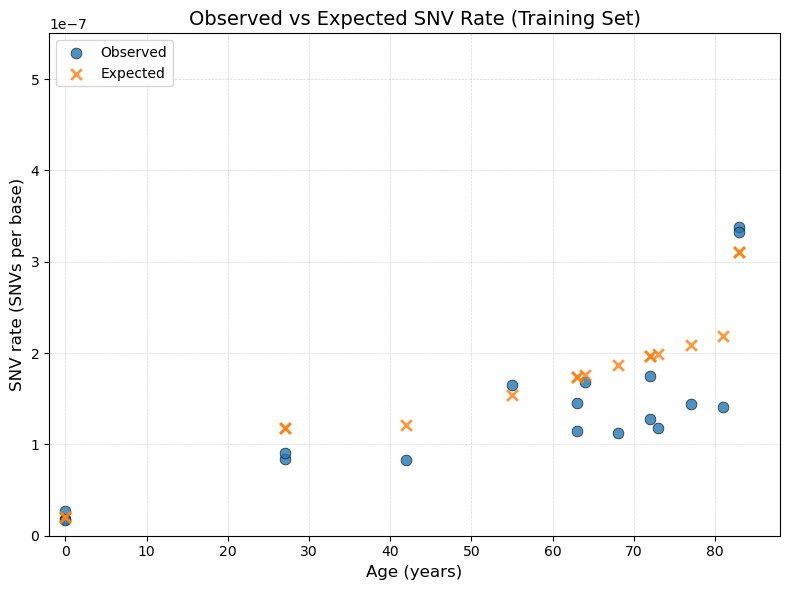

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# -----------------------
# Configuration
# -----------------------
# Path to the CSV generated in the previous step
CSV_PATH = "training_results/observed_expected.csv"
OUTPUT_PNG = "training_results/observed_vs_expected_plot.png"

# Check if file exists
if not os.path.exists(CSV_PATH):
    print(f"[ERROR] Could not find {CSV_PATH}. Please run the optimization cell first.")
else:
    # Load table
    df = pd.read_csv(CSV_PATH)

    # Convert data arrays
    ages = df["age"].values
    bases = df["bases"].values
    observed = df["observed"].values
    expected = df["expected"].values
    sample_types = df["sample_type"].values

    # Calculate SNV rates per base
    obs_rate = observed / bases
    exp_rate = expected / bases

    # -----------------------
    # Plotting
    # -----------------------
    fig, ax = plt.subplots(figsize=(8, 6))

    # Plot Observed (Blue circles)
    ax.scatter(ages, obs_rate, label="Observed", color="#1f77b4", alpha=0.8, marker="o", s=60, edgecolors='k', linewidth=0.5)

    # Plot Expected (Orange crosses)
    ax.scatter(ages, exp_rate, label="Expected", color="#ff7f0e", alpha=0.8, marker="x", s=60, linewidth=2)

    # Styling
    ax.set_xlabel("Age (years)", fontsize=12)
    ax.set_ylabel("SNV rate (SNVs per base)", fontsize=12)
    
    # Handle X-limits (pad slightly around min/max age)
    # If ages has None/NaN (Cord blood sometimes represented as negative or 0), handle gracefully
    valid_ages = ages[~np.isnan(ages)]
    if len(valid_ages) > 0:
        ax.set_xlim(min(valid_ages) - 2, max(valid_ages) + 5)
    else:
        ax.set_xlim(-2, 100)

    # Hardcoded Y-limits from your request
    ax.set_ylim(0, 5.5e-7)
    
    ax.set_title("Observed vs Expected SNV Rate (Training Set)", fontsize=14)
    ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.5)
    
    # Legend
    ax.legend(loc='upper left', frameon=True, fontsize=10)

    plt.tight_layout()
    
    # Save and Show
    plt.savefig(OUTPUT_PNG, dpi=150)
    print(f"[INFO] Plot saved to: {OUTPUT_PNG}")
    plt.show()

In [12]:
# Assuming best_thresholds is defined from your Optuna study
ref_entropy_thresh = best_thresholds['ref_entropy_min']

# Calculate failure
fail_entropy = all_variants_df['REF_ENTROPY_40BP'] < ref_entropy_thresh
pct_fail_entropy = (fail_entropy.sum() / len(all_variants_df)) * 100

print(f"Threshold used: {ref_entropy_thresh:.4f}")
print(f"Rows failing ref_entropy filter: {pct_fail_entropy:.2f}%")

NameError: name 'best_thresholds' is not defined

In [ ]:
# Extract relevant thresholds
entropy_min = best_thresholds['ref_entropy_min']
depth_max = best_thresholds['depth_percentile_max']
rp_min = best_thresholds['rp_med_min']
rp_max = best_thresholds['rp_med_max']

# Define individual failure masks
fail_ent = all_variants_df['REF_ENTROPY_40BP'] < entropy_min
fail_dep = all_variants_df['DEPTH_PERCENTILE'] > depth_max
fail_rp  = (all_variants_df['RP_MED_SSCS'] <= rp_min) | (all_variants_df['RP_MED_SSCS'] >= rp_max)

# Combine using OR (|)
combined_fail_mask = fail_ent | fail_dep | fail_rp
pct_combined_fail = (combined_fail_mask.sum() / len(all_variants_df)) * 100

print(f"Rows failing (Entropy OR Depth OR RP_Med): {pct_combined_fail:.2f}%")

# Optional Breakdown
print("-" * 20)
print(f"Breakdown of failures:")
print(f" - Ref Entropy: {fail_ent.mean()*100:.2f}%")
print(f" - Max Depth:   {fail_dep.mean()*100:.2f}%")
print(f" - RP Median:   {fail_rp.mean()*100:.2f}%")

Rows failing (Entropy OR Depth OR RP_Med): 5.99%
--------------------
Breakdown of failures:
 - Ref Entropy: 0.01%
 - Max Depth:   4.31%
 - RP Median:   1.72%


In [ ]:
# Extract thresholds
entropy_min = best_thresholds['ref_entropy_min']
depth_max = best_thresholds['depth_percentile_max']
rp_min = best_thresholds['rp_med_min']
rp_max = best_thresholds['rp_med_max']

# Define failure masks
fail_ent = all_variants_df['REF_ENTROPY_40BP'] < entropy_min
fail_dep = all_variants_df['DEPTH_PERCENTILE'] > depth_max
fail_rp  = (all_variants_df['RP_MED_SSCS'] <= rp_min) | (all_variants_df['RP_MED_SSCS'] >= rp_max)

# UPDATED: Cord PoN failure only triggers if VAF < 20%
# We use VAF_SSCS as that is your primary metric for frequency in this script
fail_pon_low_vaf = (all_variants_df['IN_CORD_PON'] == "Yes") & (all_variants_df['VAF_SSCS'] < 0.20)

# Combine using OR (|)
composite_fail_mask = fail_ent | fail_dep | fail_rp | fail_pon_low_vaf
pct_composite_fail = (composite_fail_mask.sum() / len(all_variants_df)) * 100

print(f"Results for Composite Filter (Entropy, Depth, RP_Med, and Cord PoN < 20% VAF):")
print(f"Total rows failing any of these criteria: {pct_composite_fail:.2f}%")

print("-" * 30)
print("Individual Failure Contribution:")
print(f" - Ref Entropy:        {fail_ent.mean()*100:.2f}%")
print(f" - Max Depth:          {fail_dep.mean()*100:.2f}%")
print(f" - RP Median:          {fail_rp.mean()*100:.2f}%")
print(f" - Cord PoN (<20% VAF): {fail_pon_low_vaf.mean()*100:.2f}%")

# Quick check on how many PoN hits were 'saved' by being high VAF
pon_hits_total = (all_variants_df['IN_CORD_PON'] == "Yes").sum()
pon_hits_filtered = fail_pon_low_vaf.sum()
print(f"\nNote: Of {pon_hits_total} total PoN matches, {pon_hits_filtered} were <20% VAF and thus filtered.")

Results for Composite Filter (Entropy, Depth, RP_Med, and Cord PoN < 20% VAF):
Total rows failing any of these criteria: 32.46%
------------------------------
Individual Failure Contribution:
 - Ref Entropy:        0.00%
 - Max Depth:          5.44%
 - RP Median:          2.90%
 - Cord PoN (<20% VAF): 29.39%

Note: Of 224694 total PoN matches, 126144 were <20% VAF and thus filtered.


In [ ]:
# 1. Initialize the Exome Lookup
# (Using the path from your script configuration)
exome_lookup = BedLookup(EXOME_BED_PATH, "Exome Targets")

# 2. Filter for any variant flagged by the Cord PoN
pon_variants = all_variants_df[all_variants_df['IN_CORD_PON'] == "Yes"].copy()

# 3. Check which of these are inside the Exome
# We use a lambda to check each unique position found in the PoN subset
print("[INFO] Checking PoN positions against Exome BED...")

# To make this faster, we drop duplicates by position before doing the BED lookup
unique_pon_positions = pon_variants[['CHROM', 'POS']].drop_duplicates()

is_in_exome = unique_pon_positions.apply(
    lambda row: exome_lookup.is_overlapped(row['CHROM'], row['POS']), 
    axis=1
)

# 4. Filter the unique positions and count
exome_pon_positions = unique_pon_positions[is_in_exome]
count_unique_pos = len(exome_pon_positions)

# --- Summary Report ---
total_pon_hits = len(pon_variants)
unique_total_pon_pos = len(unique_pon_positions)

print("-" * 30)
print("CORD PON EXOME ANALYSIS")
print("-" * 30)
print(f"Total PoN-flagged rows in data:      {total_pon_hits}")
print(f"Unique PoN positions (Genome-wide):  {unique_total_pon_pos}")
print(f"Unique PoN positions (Exome-only):   {count_unique_pos}")
print("-" * 30)

# Optional: View the first few positions
if count_unique_pos > 0:
    print("Example Exome PoN positions:")
    print(exome_pon_positions.head())

[INFO] Loading Exome Targets from ../../resources/hg38_exome_v2.0.2_targets_sorted_validated.re_annotated.bed...
[INFO] Loaded 283942 regions for Exome Targets.
[INFO] Checking PoN positions against Exome BED...
------------------------------
CORD PON EXOME ANALYSIS
------------------------------
Total PoN-flagged rows in data:      224694
Unique PoN positions (Genome-wide):  30667
Unique PoN positions (Exome-only):   30667
------------------------------
Example Exome PoN positions:
   CHROM      POS
2   chr1   942451
10  chr1   966227
46  chr1  1313807
55  chr1  1495668
56  chr1  1495680


In [ ]:
# 1. Extract the best thresholds from your Optuna results
sc_max = best_thresholds['avg_alt_softclip_max']
n_max  = best_thresholds['avg_alt_n_count_max']
nm_max = best_thresholds['avg_alt_nm_max']
ins_max = best_thresholds['mean_insert_max']

# 2. Define failure masks
# Fail if value is STRICTLY GREATER than the max threshold
fail_sc  = all_variants_df['AVG_ALT_SOFTCLIP'] > sc_max
fail_n   = all_variants_df['AVG_ALT_N_COUNT'] > n_max
fail_nm  = all_variants_df['AVG_ALT_NM'] > nm_max
fail_ins = all_variants_df['MEAN_INSERT'] > ins_max

# 3. Combine using OR (|) for a composite technical filter
tech_composite_fail = fail_sc | fail_n | fail_nm | fail_ins
pct_tech_composite = (tech_composite_fail.sum() / len(all_variants_df)) * 100

print(f"Results for Technical Quality Filters:")
print(f"Total rows failing ANY of these 4: {pct_tech_composite:.2f}%")

print("-" * 30)
print("Individual Failure Breakdown:")
print(f" - Softclip Max ({sc_max:.2f}):   {fail_sc.mean()*100:.22f}%")
print(f" - N-Count Max ({n_max:.2f}):    {fail_n.mean()*100:.2f}%")
print(f" - NM (Edit Dist) Max ({nm_max:.2f}): {fail_nm.mean()*100:.2f}%")
print(f" - Mean Insert Max ({ins_max:.1f}):  {fail_ins.mean()*100:.2f}%")

# 4. Identifying the "Noisiest" Filter
metrics = {
    "Softclip": fail_sc.sum(),
    "N-Count": fail_n.sum(),
    "NM-Distance": fail_nm.sum(),
    "Insert-Size": fail_ins.sum()
}
most_aggressive = max(metrics, key=metrics.get)
print("-" * 30)
print(f"The most aggressive filter in this group is: {most_aggressive}")

Results for Technical Quality Filters:
Total rows failing ANY of these 4: 30.02%
------------------------------
Individual Failure Breakdown:
 - Softclip Max (1.24):   12.1540576434679277184614%
 - N-Count Max (2.36):    9.13%
 - NM (Edit Dist) Max (4.72): 26.12%
 - Mean Insert Max (677.8):  0.03%
------------------------------
The most aggressive filter in this group is: NM-Distance
